# Práctica Final: Clasificación de Documentos con Scikit-learn y MLflow

En esta práctica, utilizarás un conjunto de datos de Scikit-learn (podeís usar el mismo que en el notebook de Intro MLFlow) para entrenar un modelo de clasificación de documentos. El objetivo es construir un modelo capaz de clasificar automáticamente documentos en categorías predefinidas.

Pasos a seguir:

    Exploración de Datos: Analiza el conjunto de datos proporcionado para comprender su estructura y contenido.

    Preprocesamiento de Texto: Realiza tareas de preprocesamiento de texto, como tokenización y vectorización, para preparar los datos para el modelado.

    Entrenamiento del Modelo: Utiliza algoritmos de clasificación de Scikit-learn para entrenar un modelo con los datos preprocesados.

    Evaluación del Modelo: Evalúa el rendimiento del modelo utilizando métricas de evaluación estándar como precisión y recall.

    Registro de Métricas con MLflow: Utiliza MLflow para registrar métricas y hiperparámetros durante el entrenamiento, facilitando la gestión y comparación de experimentos.


Nota: Dado que no voy a poder tener acceso a vuestros logs de MLFlow añadirme las imagenes de la interfaz de MLFlow en el notebook

In [ ]:
! pip install mlflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.4/84.4 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.9/202.9 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import pandas as pd
import numpy as np
import mlflow
import mlflow.sklearn

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import accuracy_score

from sklearn.datasets import load_breast_cancer, load_wine

import argparse

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
#Cargamos datasets
cancer = load_breast_cancer()
wine = load_wine()

Aunque se cargan los dos datasets, se prefiere hacer con uno diferente al utilizado en la clase introductoria. Estos datos al ser con datasets pequeños están muy controlados, sin elementos nulos, con valores bastante acotados, etc. Por lo que su exploración y preprocesamiento no requiere mucho trabajo.

In [ ]:
df = pd.DataFrame(wine['data'], columns= wine['feature_names'])

In [ ]:
df['target'] = wine['target']
df.head().T

,0,1,2,3,4
alcohol,14.23,13.20,13.16,14.37,13.24
malic_acid,1.71,1.78,2.36,1.95,2.59
ash,2.43,2.14,2.67,2.50,2.87
alcalinity_of_ash,15.60,11.20,18.60,16.80,21.00
magnesium,127.00,100.00,101.00,113.00,118.00
total_phenols,2.80,2.65,2.80,3.85,2.80
flavanoids,3.06,2.76,3.24,3.49,2.69
nonflavanoid_phenols,0.28,0.26,0.30,0.24,0.39
proanthocyanins,2.29,1.28,2.81,2.18,1.82
color_intensity,5.64,4.38,5.68,7.80,4.32


In [ ]:
df.shape

(178, 14)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
alcohol,178.0,13.000618,0.811827,11.03,12.3625,13.050,13.6775,14.83
malic_acid,178.0,2.336348,1.117146,0.74,1.6025,1.865,3.0825,5.80
ash,178.0,2.366517,0.274344,1.36,2.2100,2.360,2.5575,3.23
alcalinity_of_ash,178.0,19.494944,3.339564,10.60,17.2000,19.500,21.5000,30.00
magnesium,178.0,99.741573,14.282484,70.00,88.0000,98.000,107.0000,162.00
total_phenols,178.0,2.295112,0.625851,0.98,1.7425,2.355,2.8000,3.88
flavanoids,178.0,2.029270,0.998859,0.34,1.2050,2.135,2.8750,5.08
nonflavanoid_phenols,178.0,0.361854,0.124453,0.13,0.2700,0.340,0.4375,0.66
proanthocyanins,178.0,1.590899,0.572359,0.41,1.2500,1.555,1.9500,3.58
color_intensity,178.0,5.058090,2.318286,1.28,3.2200,4.690,6.2000,13.00


In [ ]:
df.dtypes

alcohol                         float64
malic_acid                      float64
ash                             float64
alcalinity_of_ash               float64
magnesium                       float64
total_phenols                   float64
flavanoids                      float64
nonflavanoid_phenols            float64
proanthocyanins                 float64
color_intensity                 float64
hue                             float64
od280/od315_of_diluted_wines    float64
proline                         float64
target                            int64
dtype: object

In [ ]:
df.isnull().any()

alcohol                         False
malic_acid                      False
ash                             False
alcalinity_of_ash               False
magnesium                       False
total_phenols                   False
flavanoids                      False
nonflavanoid_phenols            False
proanthocyanins                 False
color_intensity                 False
hue                             False
od280/od315_of_diluted_wines    False
proline                         False
target                          False
dtype: bool

Para hacer una exploración de los datos más en detalle, usaremos la herramienta ydata_profiling. Esta herramienta produce un informe detallado que incluye estadísticas descriptivas, distribuciones de variables, correlaciones y análisis de valores faltantes, lo que ayuda a comprender mejor la estructura y la calidad del conjunto de datos

In [ ]:
! pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=c14fbe264c99758ebe937338f865bb6af343b044728224f3d66afca019b6e99a
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport

ProfileReport(df, title = "Informe datos Wine Scikit-Learn")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Vemos que la variable flavanoids tiene una correlación muy alta con el nº total de phenols, esto se debe a que los flavonoides son una clase de compuestos fenólicos, lo que significa que son un subgrupo dentro de los fenoles. Dado que todos los flavonoides son fenoles, es lógico que haya una fuerte correlación entre ellos.

In [ ]:
train, test = train_test_split(df, test_size=0.2, shuffle=True,
                               stratify=df['target'], random_state=42)


In [ ]:
print(f'Dimensiones del dataset de training: {train.shape}')
print(f'Dimensiones del dataset de test: {test.shape}')

Dimensiones del dataset de training: (142, 14)
Dimensiones del dataset de test: (36, 14)


In [ ]:
# Guardamos
train.to_csv('/content/data_wine_train.csv', sep=';', decimal='.', index=False)
test.to_csv('/content/data_wine_test.csv', sep=';', decimal='.', index=False)

In [ ]:
df = pd.read_csv('/content/data_wine_train.csv', sep=';', decimal='.')
df.head(5).T

,0,1,2,3,4
alcohol,13.28,13.73,13.39,13.75,13.32
malic_acid,1.64,1.50,1.77,1.73,3.24
ash,2.84,2.70,2.62,2.41,2.38
alcalinity_of_ash,15.50,22.50,16.10,16.00,21.50
magnesium,110.00,101.00,93.00,89.00,92.00
total_phenols,2.60,3.00,2.85,2.60,1.93
flavanoids,2.68,3.25,2.94,2.76,0.76
nonflavanoid_phenols,0.34,0.29,0.34,0.29,0.45
proanthocyanins,1.36,2.38,1.45,1.81,1.25
color_intensity,4.60,5.70,4.80,5.60,8.42


In [ ]:
features = [x for x in list(df.columns) if x != 'target']
x_train = train[features]
y_train = train['target']

In [ ]:
# Crear el clasificador SVC
svc_clf = SVC(C=1.5, degree= 3, gamma = 'scale',
              class_weight='balanced', verbose= True,
              random_state=42)

# Crear el preprocesador
preprocessor = Pipeline(steps=[('scaler', StandardScaler())])

# Crear el modelo como pipeline
model_svc = Pipeline(steps=[('preprocessor', preprocessor), ('SVC', svc_clf)])

In [ ]:
model_svc.fit(x_train, y_train)

[LibSVM]

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('scaler', StandardScaler())])),
                ('SVC',
                 SVC(C=1.5, class_weight='balanced', random_state=42,
                     verbose=True))])

In [ ]:
accuracy_train = model_svc.score(x_train,y_train)

In [ ]:
accuracy_train

1.0

Repetimos pero para los datos de test.

In [ ]:
df_test = pd.read_csv('/content/data_wine_test.csv', sep=';', decimal='.')

In [ ]:
features = [x for x in list(df_test.columns) if x != 'target']
x_test = test[features]
y_test = test['target']

Métricas

In [ ]:
accuracy_test = model_svc.score(x_test,y_test)
accuracy_test

0.9722222222222222

In [ ]:
# Hacer predicciones en el conjunto de prueba
y_pred = model_svc.predict(x_test)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[12  0  0]
 [ 0 14  0]
 [ 0  1  9]]


In [ ]:
cl_report = classification_report(y_test, y_pred, output_dict= True)

In [ ]:
print(cl_report)

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 12}, '1': {'precision': 0.9333333333333333, 'recall': 1.0, 'f1-score': 0.9655172413793104, 'support': 14}, '2': {'precision': 1.0, 'recall': 0.9, 'f1-score': 0.9473684210526316, 'support': 10}, 'accuracy': 0.9722222222222222, 'macro avg': {'precision': 0.9777777777777779, 'recall': 0.9666666666666667, 'f1-score': 0.9709618874773142, 'support': 36}, 'weighted avg': {'precision': 0.974074074074074, 'recall': 0.9722222222222222, 'f1-score': 0.9719701552732407, 'support': 36}}


In [ ]:
cl_report_df = pd.DataFrame(cl_report).transpose()

In [ ]:
precision = cl_report_df['precision']
recall = cl_report_df['recall']

In [ ]:
print(recall)

0               1.000000
1               1.000000
2               0.900000
accuracy        0.972222
macro avg       0.966667
weighted avg    0.972222
Name: recall, dtype: float64


In [ ]:
model_svc.get_params()

{'memory': None,
 'steps': [('preprocessor', Pipeline(steps=[('scaler', StandardScaler())])),
  ('SVC', SVC(class_weight='balanced', random_state=42, verbose=True))],
 'verbose': False,
 'preprocessor': Pipeline(steps=[('scaler', StandardScaler())]),
 'SVC': SVC(class_weight='balanced', random_state=42, verbose=True),
 'preprocessor__memory': None,
 'preprocessor__steps': [('scaler', StandardScaler())],
 'preprocessor__verbose': False,
 'preprocessor__scaler': StandardScaler(),
 'preprocessor__scaler__copy': True,
 'preprocessor__scaler__with_mean': True,
 'preprocessor__scaler__with_std': True,
 'SVC__C': 1.0,
 'SVC__break_ties': False,
 'SVC__cache_size': 200,
 'SVC__class_weight': 'balanced',
 'SVC__coef0': 0.0,
 'SVC__decision_function_shape': 'ovr',
 'SVC__degree': 3,
 'SVC__gamma': 'scale',
 'SVC__kernel': 'rbf',
 'SVC__max_iter': -1,
 'SVC__probability': False,
 'SVC__random_state': 42,
 'SVC__shrinking': True,
 'SVC__tol': 0.001,
 'SVC__verbose': True}

Instalamos y preparamos el entorno de NGrok.

In [ ]:
!pip install pyngrok

In [ ]:
mlflow.set_experiment('Wine Classifer with metrics BG13 - RA')
with mlflow.start_run(run_name='Despliegue de Algos BD13 (2) - RA'):
  mlflow.log_param('C', 1.5)
  mlflow.log_metric('accuracy train', accuracy_train)
  mlflow.log_metric('accuracy test', accuracy_test)
  mlflow.log_metric('recall para target 0', recall[0])
  mlflow.log_metric('recall para target 1', recall[1])
  mlflow.log_metric('recall para target 2', recall[2])
  mlflow.log_metric('precision para target 0', precision[0])
  mlflow.log_metric('precision para target 1', precision[1])
  mlflow.log_metric('precision para target 2', precision[2])

get_ipython().system_raw('mlflow ui --port 5000 &')

from pyngrok import ngrok

ngrok.kill()

NGROK_AUTH_TOKEN = '2iizevnFIykG1DSnz2KCri7WoUF_D1rww3iJZk4SR8hfxDzo'

ngrok.set_auth_token(NGROK_AUTH_TOKEN)

ngrok_tunnel = ngrok.connect(addr='5000', proto= 'http', bind_tls = True)
print('El tracking UI:', ngrok_tunnel)

El tracking UI: NgrokTunnel: "https://55ae-35-230-119-210.ngrok-free.app" -> "http://localhost:5000"


In [ ]:
from mlflow.tracking import MlflowClient
client = MlflowClient()

In [ ]:
model_name= 'clf_model'

In [ ]:
with mlflow.start_run() as run:
  run_num = run.info.run_id
  model_uri = 'runs:/{run_id}/artifact_path'.format(run_id=run_num, artifact_path=model_name)

  mlflow.log_metric('accuracy_train', accuracy_train)
  mlflow.sklearn.log_model(model_svc,model_name)

  model_details = mlflow.register_model(
      model_uri=model_uri,
      name=model_name
  )

/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
Successfully registered model 'clf_model'.
Created version '1' of model 'clf_model'.


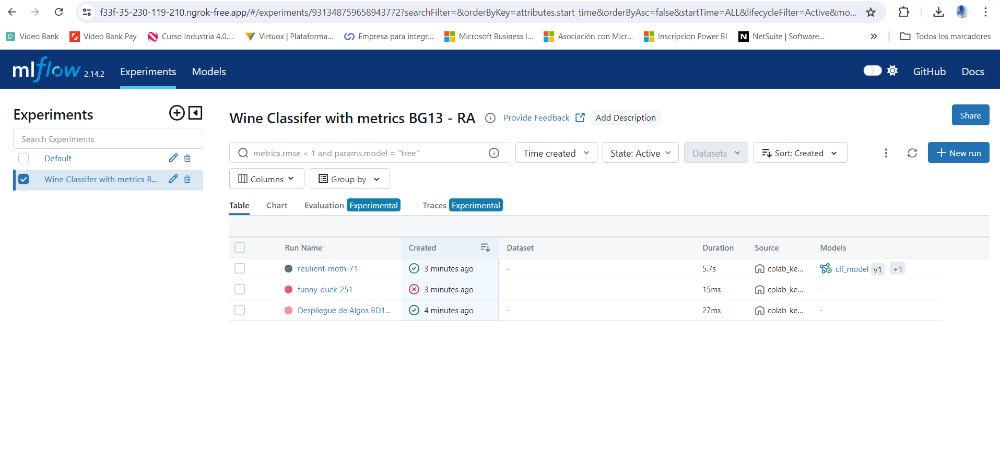

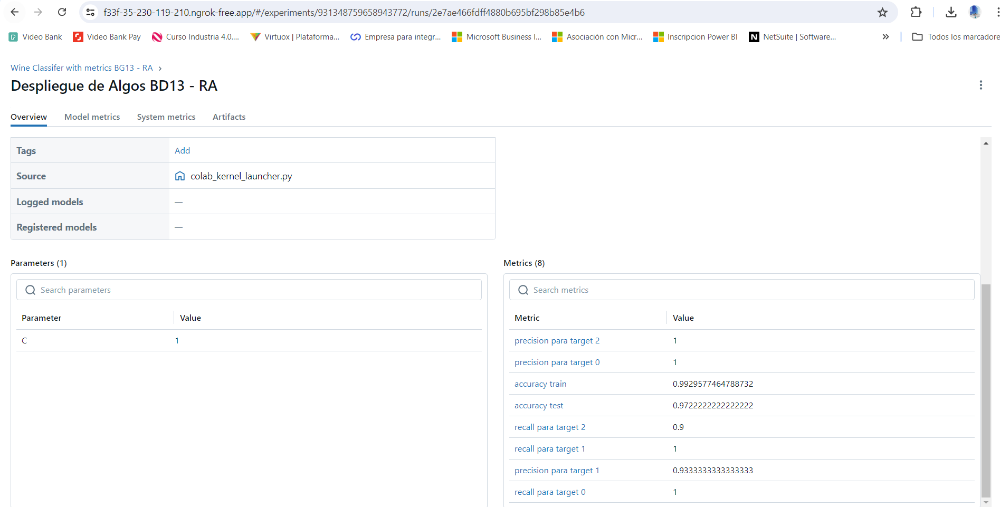

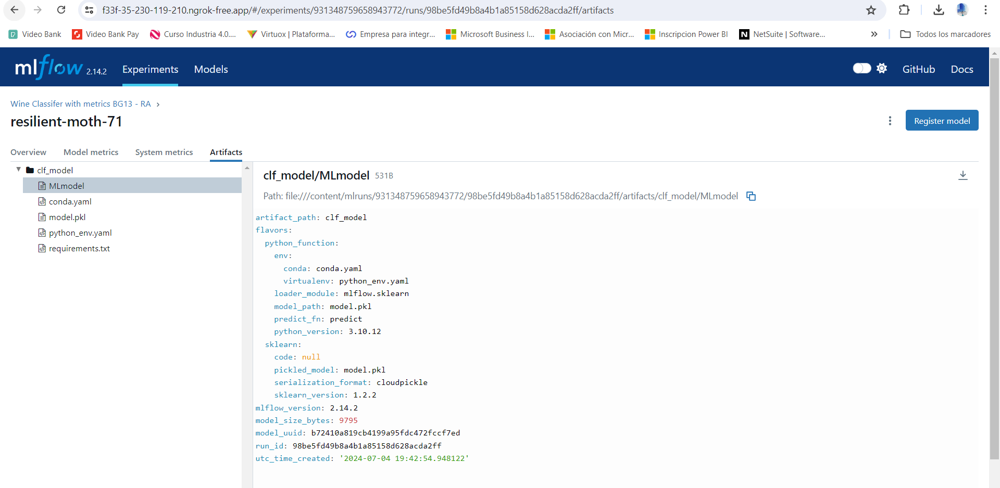

Test 2: Se cambia la C del modelo de 1.0 a 1.5
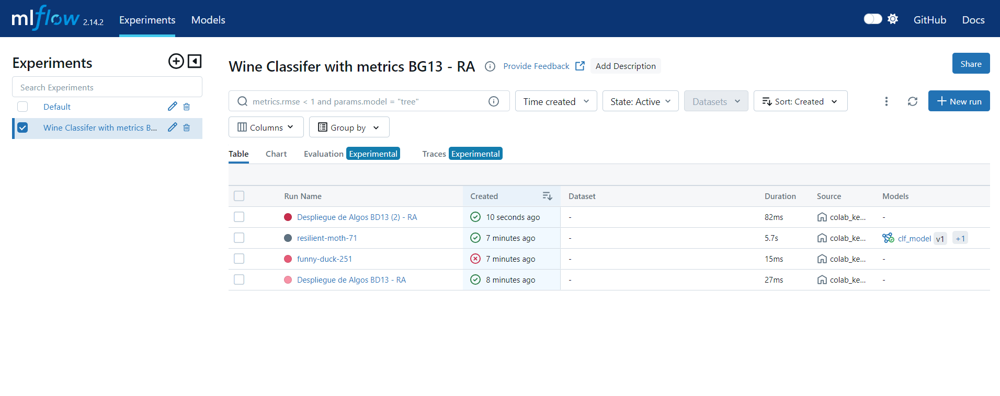

Se comparan los resultados de ambos modelos. Sin cambios notables:
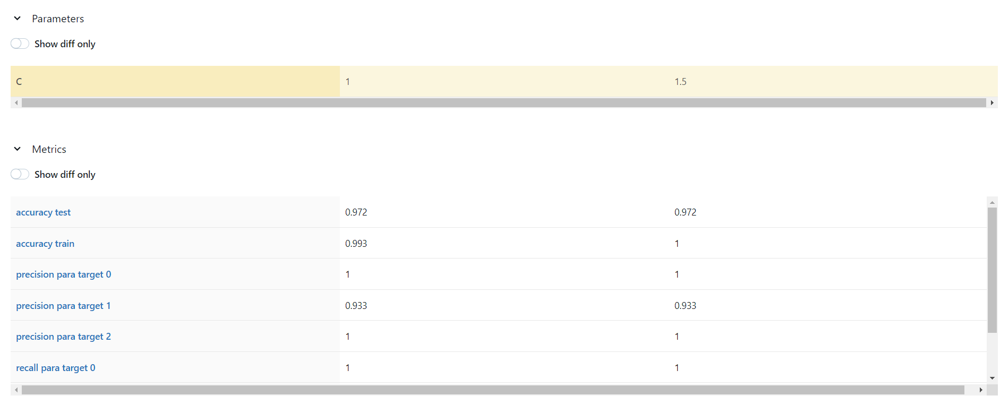

## Generar .py de funciones y main con al menos dos argumentos de entrada.

In [ ]:
# funciones.py
%%writefile funciones_mlflow.py

import pandas as pd
import numpy as np
import mlflow
import mlflow.sklearn
from pyngrok import ngrok

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import accuracy_score

from sklearn.datasets import load_breast_cancer, load_wine

import argparse
import subprocess
import time
import mlflow

def argumentos():
    print("entrando en argumentos")
    parser = argparse.ArgumentParser(description='__main__ de la aplicación con argumentos de entrada.')
    parser.add_argument('--nombre_job', type=str, help='Valor para el parámetro nombre_documento.')
    parser.add_argument('--c_list', nargs='+', type=float, help='List of c values.')
    return parser.parse_args()

def load_dataset():
    wine = load_wine()
    df = pd.DataFrame(wine['data'], columns=wine['feature_names'])
    df['target'] = wine['target']
    return df

def data_treatment(df):
    # Split data into train and test sets
    train, test = train_test_split(df, test_size=0.2)
    test_target = test['target']
    test[['target']].to_csv('test-target.csv', index=False)
    del test['target']
    test.to_csv('test.csv', index=False)

    features = [x for x in list(train.columns) if x != 'target']
    x_raw = train[features]
    y_raw = train['target']
    x_train, x_test, y_train, y_test = train_test_split(x_raw, y_raw,
                                                        test_size=.20,
                                                        random_state=123,
                                                        stratify=y_raw)
    return x_train, x_test, y_train, y_test

def mlflow_tracking(nombre_job, x_train, x_test, y_train, y_test, c_list):
    mlflow_ui_process = subprocess.Popen(['mlflow', 'ui', '--port', '5000'])
    print(mlflow_ui_process)
    time.sleep(5)
    mlflow.set_experiment(nombre_job)
    for i in c_list:
        with mlflow.start_run() as run:
            clf = SVC(C=1.5, degree= 3, gamma = 'scale',
              class_weight='balanced', verbose= True,
              random_state=42)

            preprocessor = Pipeline(steps=[('scaler', StandardScaler())])

            model = Pipeline(steps=[('preprocessor', preprocessor),
                                    ('SVC', clf)])
            model.fit(x_train, y_train)
            accuracy_train = model.score(x_train, y_train)
            accuracy_test = model_svc.score(x_test,y_test)

            y_pred = model_svc.predict(x_test)

            cl_report = classification_report(y_test, y_pred, output_dict= True)
            cl_report_df = pd.DataFrame(cl_report).transpose()
            precision = cl_report_df['precision']
            recall = cl_report_df['recall']

            mlflow.log_metric('accuracy_train', accuracy_train)
            mlflow.log_metric('accuracy test', accuracy_test)
            mlflow.log_metric('recall para target 0', recall[0])
            mlflow.log_metric('recall para target 1', recall[1])
            mlflow.log_metric('recall para target 2', recall[2])
            mlflow.log_metric('precision para target 0', precision[0])
            mlflow.log_metric('precision para target 1', precision[1])
            mlflow.log_metric('precision para target 2', precision[2])
            mlflow.log_param('c_list', i)
            mlflow.sklearn.log_model(model, 'clf-model')

            ngrok.kill()

            NGROK_AUTH_TOKEN = '2iizevnFIykG1DSnz2KCri7WoUF_D1rww3iJZk4SR8hfxDzo'
            ngrok.set_auth_token(NGROK_AUTH_TOKEN)
            ngrok_tunnel = ngrok.connect(addr='5000', proto= 'http', bind_tls = True)

    print("Se ha acabado el entrenamiento del modelo correctamente")

Overwriting funciones_mlflow.py


In [ ]:
# main.py
%%writefile main_mlflow.py
from funciones_mlflow import argumentos, load_dataset, data_treatment, mlflow_tracking

def main():
  print("Ejecutamos el main")
  args_values = argumentos()
  df = load_dataset()
  x_train, x_test, y_train, y_test = data_treatment(df)
  mlflow_tracking(args_values.nombre_job, x_train, x_test, y_train, y_test, args_values.c_list)

if __name__ == "__main__":
  main()

Overwriting main_mlflow.py


In [ ]:
!python3 main_mlflow.py \
--nombre_job "Practica script bd13 - RA" \
--c_list 0.25 0.5 0.75 1.0 1.25 1.5

## Práctica parte FastAPI

### Para esta parte de la práctica teneis que generar un script con al menos 5 modulos app.get y dos de ellos tienen que ser pipelines de HF.

### Parte de la practica se tendra que entregar en capturas de pantalla. Las capturas de pantalla a adjuntas son las siguientes.

### 1. Captura de la pantalla docs con al menos 5 modulos.
### 2. Captura de cada una de los modulos con la respuesta dentro de docs.
### 3. Captura de cada uno de los modulos en la llamada https.
### 4. Todo el codigo usado durante el proceso. Notebooks y scripts.

In [1]:
!pip install fastapi
!pip install pyngrok
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 819.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.4/62.4 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.4/341.4 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 24.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [9]:
%%writefile practica_fastapi.py

from fastapi import FastAPI
from transformers import pipeline
import uvicorn

app = FastAPI()

@app.get("/") #Mensaje al iniciar el aplicativo.
def read_root():
    return {"message": "Welcome to the FastAPI and Hugging Face pipeline practice BD13- RA"}

@app.get("/sentiment") #Como el visto en clase.
def analyze_sentiment(text: str):
  sentiment_analysis_pipeline = pipeline('sentiment-analysis')
  result = sentiment_analysis_pipeline(text)
  return {"sentiment": result}

@app.get("/summarize")
def summarize_text(text: str):
  summarization_pipeline = pipeline("summarization")
  result = summarization_pipeline(text)
  return {"summary": result}

@app.get("/translate")
def translate_text(text: str):
  translation_pipeline = pipeline("translation_en_to_fr")
  result = translation_pipeline(text)
  return {"translation": result}

@app.get("/add")
def adding(n1: float, n2: float):
  return {"Result": n1+n2}

@app.get("/square")
def square(number: float):
  return {"Result": number**2}




Overwriting practica_fastapi.py


In [11]:
import nest_asyncio
from pyngrok import ngrok, conf

NGROK_AUTH_TOKEN = '2iizevnFIykG1DSnz2KCri7WoUF_D1rww3iJZk4SR8hfxDzo'
conf.get_default().auth_token = NGROK_AUTH_TOKEN
ngrok.kill()
ngrok_tunnel = ngrok.connect(8000)
print('Este es el URL:', ngrok_tunnel.public_url)
nest_asyncio.apply()

Este es el URL: https://cdf1-104-196-98-112.ngrok-free.app


In [12]:
! uvicorn practica_fastapi:app --port 8000

2024-07-05 08:20:19.972042: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-05 08:20:19.972149: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-05 08:20:19.974625: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-05 08:20:19.989052: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-05 08:20:21.722885: W tensorflow/compiler/tf2

A continuación, se adjuntan capturas de pantallas del script desarrollado:

1. Pantalla principal al abrir enlace:
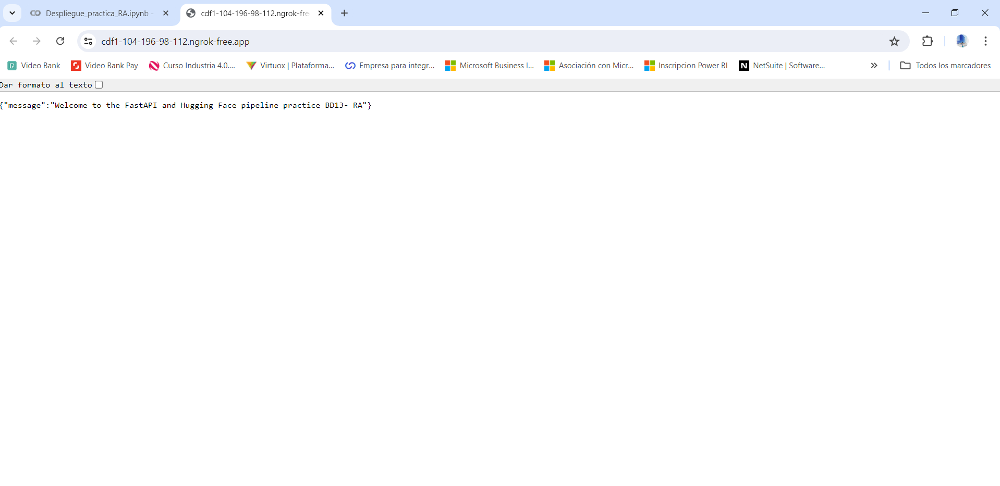

2. Pantalla 'sentiment':
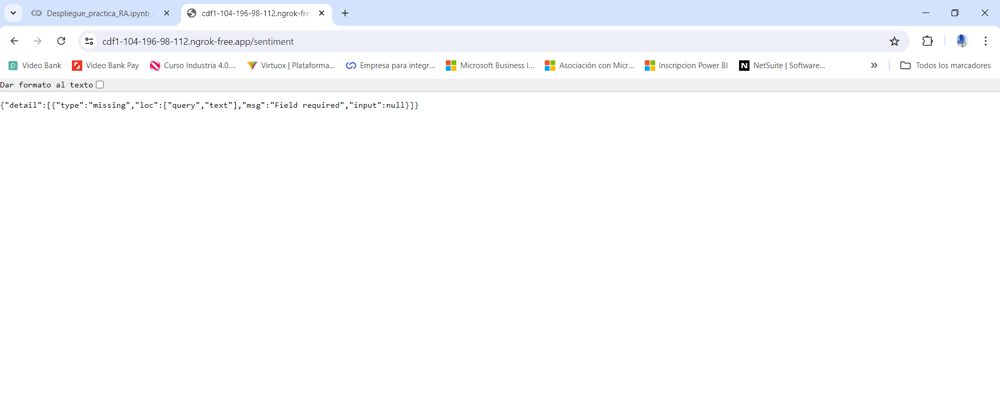

3. Pantalla 'summarize':
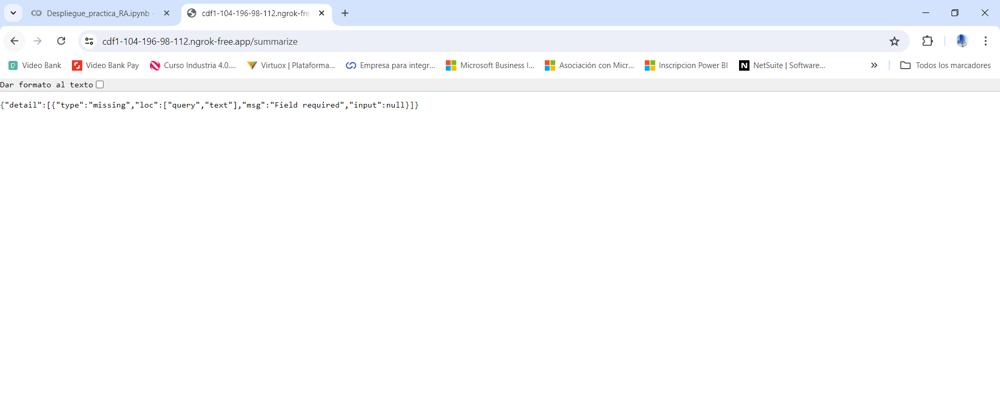

Así seguiría con el resto de las pantallas, así que abrimos /docs para la interacción con FastAPI!

Al abrir el aplicativo de FastAPI, se pueden observar los modulos get desarrollados en el script:
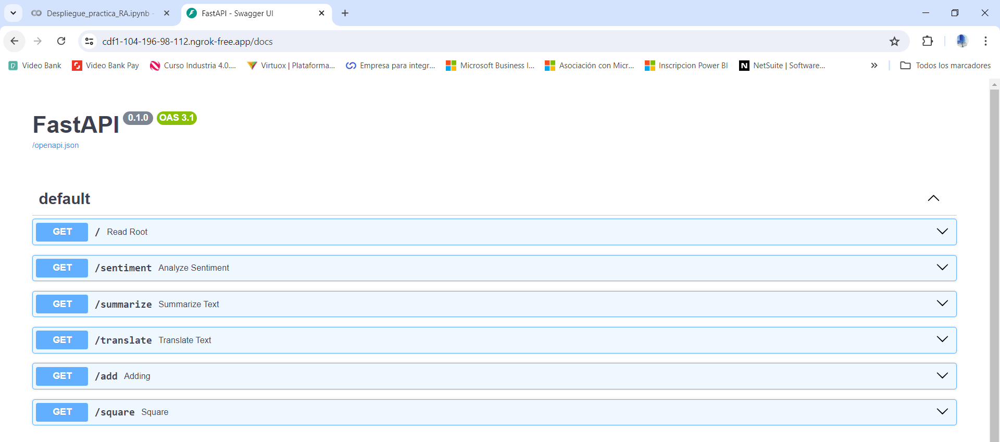

Ante la siguiente entrada: 'Me siento contento porque estoy viajando, sin embargo me da pena porque es por trabajo'

El algoritmo de análisis de sentimiento desplegado devuelve el siguiente resultado:
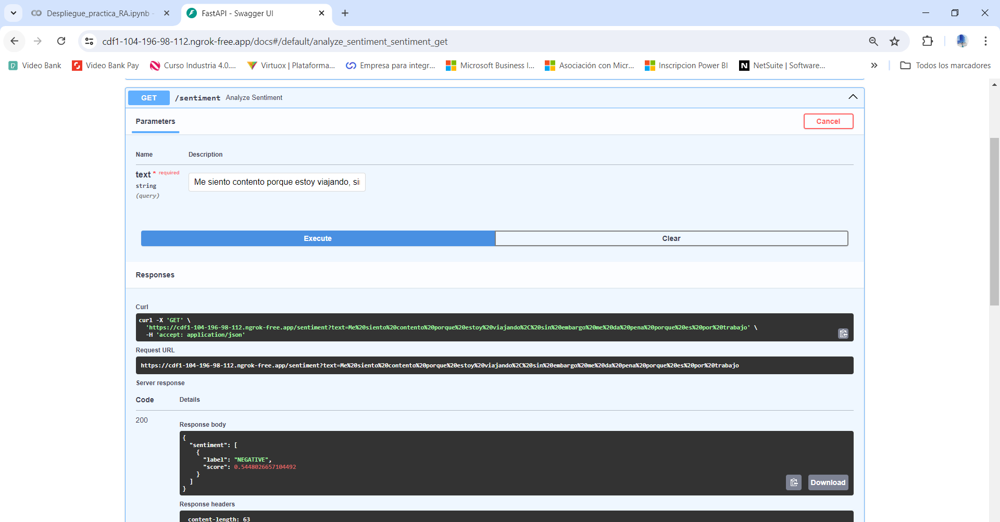

Para el caso del algoritmo de 'summarize', se introduce el siguiente texto: 'El día de ayer me fui de viaje hacia Estocolmo, estuve viajando la mayor parte del día porque salí desde muy temprano de mi casa, en valencia, y apenas llegué a mi destino a media noche del día siguiente. Estoy emocionado por la aventura que me espera, quiero ir a hacer turismo y pasearme por las calles de esta encantadora ciudad.'

Se genera la siguiente respuesta:
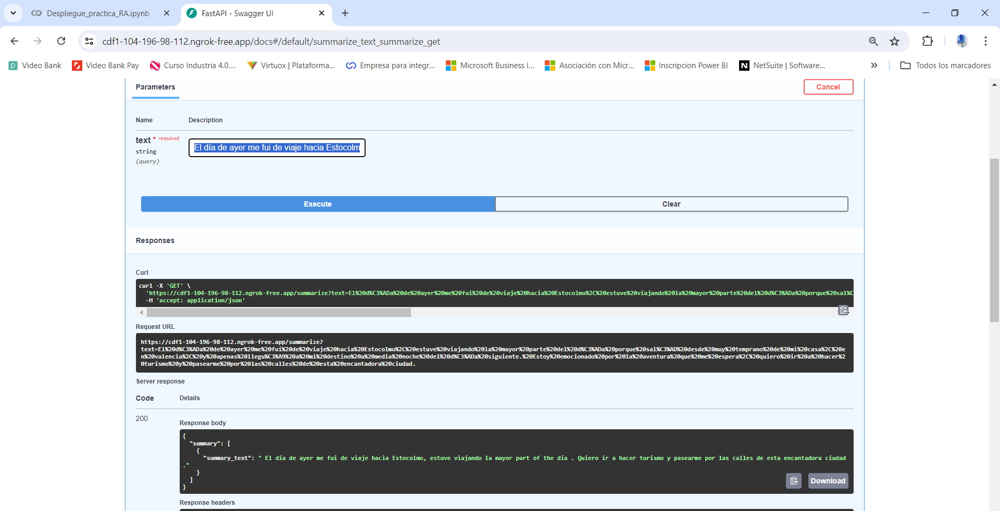

El tercer algoritmo implementado es un traductor de inglés a francés, se utiliza la misma frase del ejercicio anterior en su traducción al inglés: 'Yesterday I went on a trip to Stockholm, I was travelling most of the day because I left very early from my home in Valencia, and I just arrived at my destination at midnight the next day. I am excited about the adventure that awaits me, I want to go sightseeing and stroll through the streets of this charming city.'

El resultado es el siguiente:

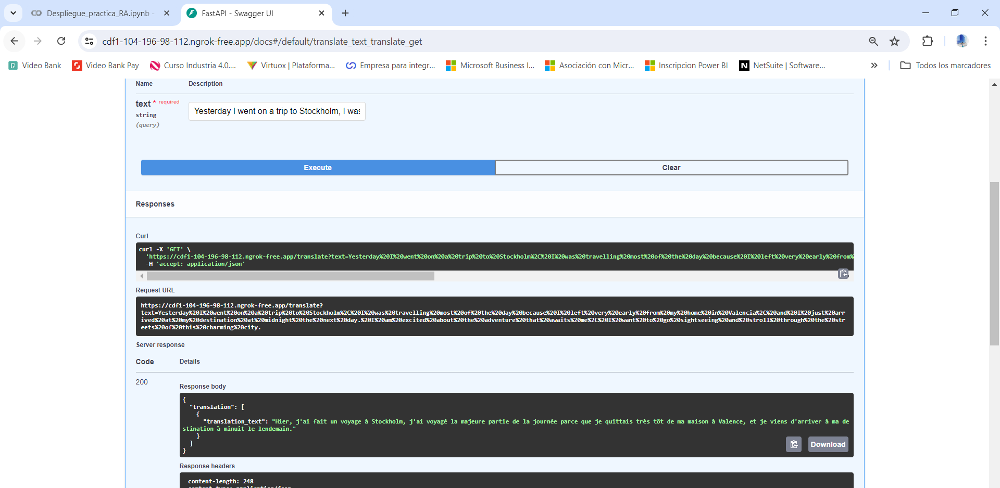

Los últimos dos modulos son más simples, el primero de ellos es el modulo de suma. Dado dos numeros se obtiene el resultado (ejemplo: 3+7):
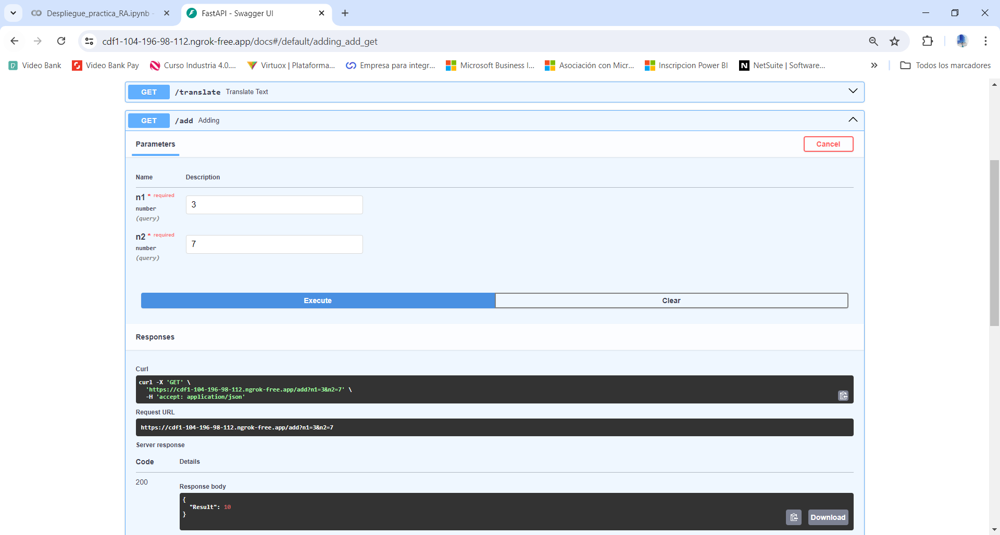

Por último, el modulo de elevar al cuadrado un número (ejemplo: 3):
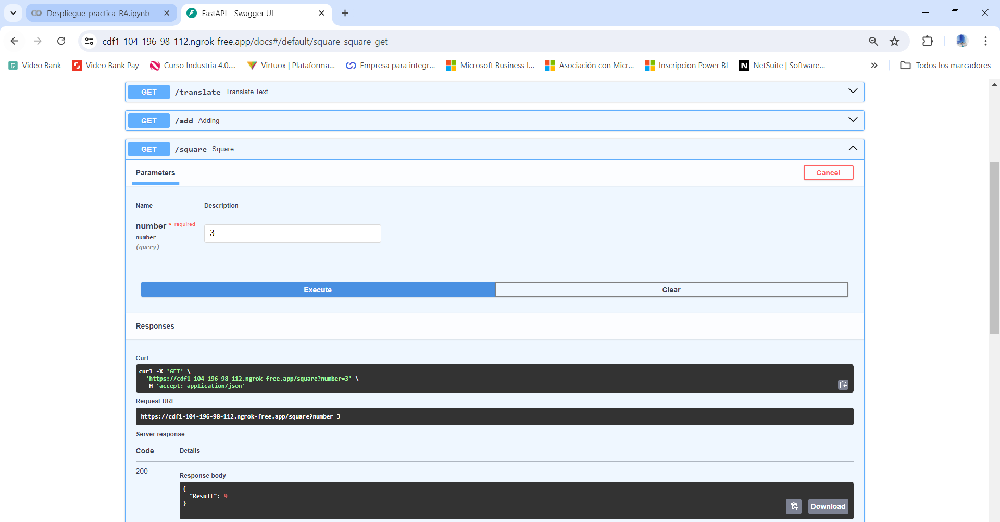